<span style='color:gray'> <span style="font-size:25px;"> **Development of "Machine Learning Models"  (Workflow)**
    
In this Notebook, the machine learning model will be created and then the data from well-logs DLIS file [after preprocessing, sorting and finalizing the data] is loaded as input for Machine Learning model (ML); 
* Random Forest Regressor
* Gradient Boosting Regressor
    
    
For the prediction of petrophysical properties, such as porosity, permeability and water saturation, these two Regressor models **Random Forest Regressor** and **Gradient Boosting Regressor** are suitable.

They are Ensemble Based Tree Methods; they are based on the generation of Decision Trees.

We use Regression Models since we want to predict a continuous variable.

**Advantages** of the 2 regression models, since they are based on Decision Trees:

* They do not need the normalization or scaling of the original dataset;
* They are not sensitive to outliers, thus, outliers detection and removal are not required.

**==================================================================================================================**
    
In well-log machine learning models, the choice between regression and classification (Supervised ML) depends on the nature of the problem you are trying to solve and the type of data you have. Let's break down the reasons why regression is often preferred over classification in this context:

**Continuous Output**: Well-log data often involves continuous measurements such as porosity, permeability, resistivity, and other geological properties. Regression is well-suited for predicting and modeling continuous numerical values. Classification, on the other hand, is typically used when the output is categorical or discrete, like classifying lithology or rock types.

**Data Distribution**: Well-log data tends to have a wide range of continuous values. Using classification would require discretizing this data into bins or classes, which can lead to loss of information and potentially introduce biases. Regression models can capture the nuances and variations present in the continuous data more effectively.

**Evaluation Metrics**: Regression models are evaluated using metrics such as mean squared error (MSE), root mean squared error (RMSE), or mean absolute error (MAE). These metrics are well-suited for measuring the accuracy of predictions involving continuous values. Classification models, on the other hand, use metrics like accuracy, precision, recall, and F1-score, which are designed for categorical predictions.

**Feature Importance**: Well-log data analysis often involves understanding the relationships between different geological features and the target property. Regression models can provide insights into the quantitative impact of each feature on the predicted values, aiding in geological interpretation.


<span style='color:gray'> <span style="font-size:20px;"> 
**Importing Libraries, Regressors, and Required Dependencies**

In [33]:
%pip install --quiet --upgrade scikit-learn==1.2.2
%pip install --quiet qbstyles


# Importing the dependencies
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

from qbstyles import mpl_style
mpl_style(dark=False)  # Set light matplotlib style

import matplotlib.patches as mpatches  # To create a legend with a color box
import pickle

# Importing the models 
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neural_network import MLPRegressor
                                         
from sklearn.model_selection import RandomizedSearchCV

# train_test_split is a function 
# cross_val_score and KFold are functions

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, KFold 

# Regression metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_squared_error, mean_absolute_error

# The package "Matplotlib Inline Back-end" provides support for Matplotlib to display figures directly inline
# "svg" stands for "scalable vector graphic". The plot can be scaled without compromising its quality
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('svg')

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


# ========================================================

<span style='color:gray'> <span style="font-size:20px;">**Load the Random Forest & Gradient Boosting Models**</span> </span>

In [34]:
# Define the full path to the save file
save_path = '/Users/amirhosseinakhondzadeh/CODE_WELLLOGS/Petrobras Well-log Analysis/Processed Data (out put of preprocessing == Input of ML)/Output of Predictive Models/random_forest.pickle'

with open(save_path, "rb") as file:      # Unpickle the Random Forest model
    RandomForest_model = pickle.load(file)

In [35]:
# Define the full path to the save file
save_path = '/Users/amirhosseinakhondzadeh/CODE_WELLLOGS/Petrobras Well-log Analysis/Processed Data (out put of preprocessing == Input of ML)/Output of Predictive Models/gradient_boosting.pickle'

with open(save_path, "rb") as file:      # Unpickle the Random Forest model
    GradientBoosting_model = pickle.load(file)

<span style='color:gray'> <span style="font-size:15px;"> **Loading a well dataset on the model (for evaluation)**</span> </span>

You can use the loaded model to compute predictions

We perform the prediction on the entire original dataset 

In [36]:
file_path = '/Users/amirhosseinakhondzadeh/CODE_WELLLOGS/Petrobras Well-log Analysis/Processed Data (out put of preprocessing == Input of ML)/Output of well data, [unique dataframe creation]/df_9_ITP_ML.csv'
df = pd.read_csv(file_path)
df

,DEPTH,GR,AT10,AT30,AT90,RHOZ,NPHI,DTCO,PEFZ,NMRFF,NMREFF,NMRTOT
0,5230.899893,18.364668,19.196234,20.528210,22.001585,2.112285,27.765093,68.337450,8.430419,0.146941,0.206191,0.279142
1,5230.999893,18.145609,17.247047,17.625770,18.691048,2.125317,28.151360,67.993440,8.418438,0.142935,0.207419,0.269785
2,5231.099893,17.943176,15.329754,15.300582,16.073359,2.130714,29.748737,67.663246,8.383753,0.137963,0.210700,0.263316
3,5231.199893,18.042002,11.579553,11.556740,11.997000,2.124417,31.248146,67.298560,8.239479,0.131576,0.215271,0.257083
4,5231.299893,18.240273,10.135851,10.116982,10.471834,2.124772,30.671698,66.678116,8.161089,0.124349,0.220581,0.251031
...,...,...,...,...,...,...,...,...,...,...,...,...
5691,5799.999902,14.363359,11.817383,7.377117,6.033832,2.555375,6.492657,57.562070,5.019712,0.059633,0.073778,0.075219
5692,5800.099902,15.273518,14.202330,8.807688,7.079647,2.564941,5.530566,56.620247,5.144241,0.055423,0.070325,0.073819
5693,5800.199902,18.301525,15.466550,9.621761,7.668280,2.570117,4.758304,55.723118,5.173993,0.051565,0.067183,0.071256
5694,5800.299902,20.122280,16.774020,10.493274,8.294627,2.573653,3.776176,55.031116,5.188010,0.051565,0.067183,0.071256


**Add Petrophysics data of well 9_ITP_RJS**

In [37]:
# Replace 'your_file.xlsx' with the path to your Excel file
file_path = '/Users/amirhosseinakhondzadeh/@ DATA/9-lTP-1-RJS/Dados de Rochas e Fluidos/PETROFISICABASICA/9ITP 0001  RJS-Petrofisica Basica.xls'
df_Ptroph = pd.read_excel(file_path)

# Extract the desired columns and sort by "Profundidade" while dropping NaN values
df_Ptroph = df_Ptroph[["Profundidade", "Permeabilidade Long. (mD)", "Porosidade%"]].sort_values("Profundidade", ascending=True).dropna()

df_Ptroph = df_Ptroph.iloc[102:164]  # Extract rows A to B (inclusive)
df_Ptroph = df_Ptroph.sort_values("Profundidade", ascending=True)  # Sort the data based on "Profundidade" (Depth)
df_Ptroph = df_Ptroph.reset_index(drop=True)  # Reset the index after sorting

# 1) Filter out rows with '-' in the "Porosidade%" column
# 2) Now, you can replace ',' with '.' and convert the "Porosidade%" column to float
df_Ptroph = df_Ptroph[df_Ptroph["Porosidade%"] != '-'] # 1
df_Ptroph["Porosidade%"] = df_Ptroph["Porosidade%"].str.replace(',', '.').astype(float) # 2

# Continue with your code
DEPTH_lab = df_Ptroph["Profundidade"]
K_lab = df_Ptroph["Permeabilidade Long. (mD)"]
PHI_lab = df_Ptroph["Porosidade%"]

df_Ptroph

,Profundidade,Permeabilidade Long. (mD),Porosidade%
0,5344,0,2.2
2,"5359,9",0,4.1
3,5363,"0,49",6.1
4,5376,"1,69",6.8
5,"5378,7","0,044",7.6
6,"5384,2","0,012",7.1
7,"5391,2","0,013",3.0
8,5415,"355,6",20.4
9,"5420,7","0,028",2.4
10,"5423,7","1,77",14.1


In [38]:
predictors = ["GR", "AT90", "RHOZ", "NPHI", "DTCO", "PEFZ"]  
outputs = ["NMREFF","NMRFF","NMRTOT"]  # They are predicted at the same time 

X = df[predictors]
y = df[outputs]

<span style='color:Green'> <span style="font-size:30px;">**=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+**</span> </span>

<span style='color:blue'> <span style="font-size:30px;">**Random Forest**</span> </span>

In [39]:
y_prediction_rf = RandomForest_model.predict(X)

# Extract the predicted values for output 1, output 2 and output 3
y_prediction_rf_EFF = y_prediction_rf[:, 0]
y_prediction_rf_FF = y_prediction_rf[:, 1]
y_prediction_rf_TOT = y_prediction_rf[:, 2]


# Measurement Values of Y (NMR ==> EFECTIVE, Free Fluid, TCMR)
y_EFF = y.drop(columns=["NMRFF","NMRTOT"])      # CMRP_3MS [EFECTIVE Porosity]
y_FF = y.drop(columns=["NMREFF","NMRTOT"])   # CMFF [Free Fluid Porosity]
y_TOT = y.drop(columns=["NMREFF","NMRFF"])  # TCMR [Total Porosity]

In [40]:
# Permeability
FF = y_prediction_rf_FF
PHI_tot = y_prediction_rf_TOT
BF = y_prediction_rf_TOT - y_prediction_rf_FF
a = 10**4
b = 2
c = 4

# Calculate k
k = a * ((FF / BF) ** b) * (PHI_tot ** c)

#================================================
# Saturation
FF = y_prediction_rf_FF
PHI_eff = y_prediction_rf_EFF
PHI_tot = y_prediction_rf_TOT

Swie = ((PHI_tot-FF)/ PHI_eff)*100

<span style='color:gray'> <span style="font-size:30px;">**Plots**</span> </span>

<span style='color:gray'> <span style="font-size:20px;">**Random Forest - Scatter Plot**</span> </span>

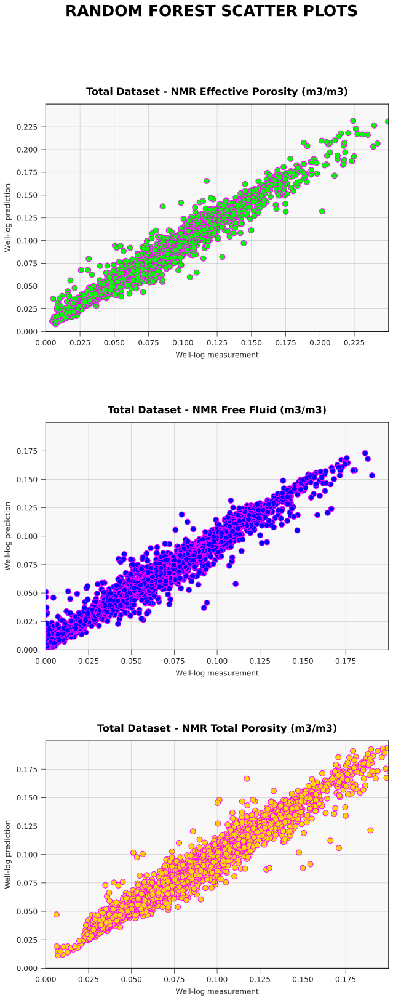

In [41]:
# Random Forest Scatter Plots 
fig, ax = plt.subplots(3,1, figsize=(10,25))
fig.suptitle("RANDOM FOREST SCATTER PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.89,hspace=0.4)

#Set up the subplots grid
ax1 = plt.subplot2grid((3,1),(0,0),rowspan=1,colspan=1) 
ax2 = plt.subplot2grid((3,1),(1,0),rowspan=1,colspan=1) 
ax3 = plt.subplot2grid((3,1),(2,0),rowspan=1,colspan=1) 


# First Scatter Plot
ax1.scatter(y_EFF,y_prediction_rf_EFF, s=80, c='lime', edgecolors='magenta')
ax1.set_xlabel('Well-log measurement', fontsize=12) 
ax1.set_ylabel('Well-log prediction', fontsize=12)
ax1.set_title('Total Dataset - NMR Effective Porosity (m3/m3)', fontsize=16, fontweight='bold')
ax1.set_xlim(0,0.25)
ax1.set_ylim(0,0.25)
ax1.set_xticks(np.arange(0, 0.25, 0.025))
ax1.set_yticks(np.arange(0, 0.25, 0.025))

# Second Scatter Plot
ax2.scatter(y_FF,y_prediction_rf_FF, s=80, c='blue', edgecolors='magenta')
ax2.set_xlabel('Well-log measurement', fontsize=12) 
ax2.set_ylabel('Well-log prediction', fontsize=12)
ax2.set_title('Total Dataset - NMR Free Fluid (m3/m3)', fontsize=16, fontweight='bold')
ax2.set_xlim(0,0.200)
ax2.set_ylim(0,0.200)
ax2.set_xticks(np.arange(0, 0.200, 0.025))
ax2.set_yticks(np.arange(0, 0.200, 0.025))

# Third Scatter Plot 
ax3.scatter(y_TOT,y_prediction_rf_TOT, s=80, c='gold', edgecolors='magenta')
ax3.set_xlabel('Well-log measurement', fontsize=12) 
ax3.set_ylabel('Well-log prediction', fontsize=12)
ax3.set_title('Total Dataset - NMR Total Porosity (m3/m3)', fontsize=16, fontweight='bold')
ax3.set_xlim(0,0.200)
ax3.set_ylim(0,0.200)
ax3.set_xticks(np.arange(0, 0.200, 0.025))
ax3.set_yticks(np.arange(0, 0.200, 0.025))


# Add a black border to each subplot
for ax in [ax1,ax2,ax3]:
    ax.spines['top'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    
# Set font size of the tick labels
for ax in [ax1,ax2,ax3]:
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
# Set grid 
for ax in [ax1,ax2,ax3]:
    ax.grid(color='black',lw=0.5)

<span style='color:gray'> <span style="font-size:20px;">**Random Forest - Well-log Plot**</span> </span>

Plotting **Predicted NMR** & **Measured (log) NMR** + **Permeability and Satutration from Predicted NMR**

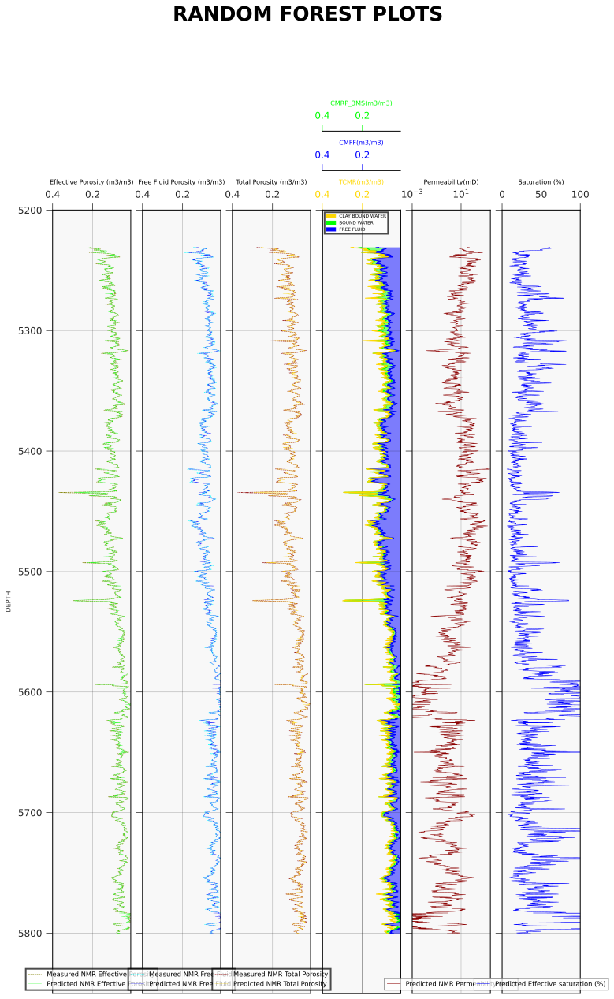

In [42]:
# Another way to perform comparison between the well log measurements and the predicted values 
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(12,20))
fig.suptitle("RANDOM FOREST PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.8, wspace=0.15)

track_names = ['EFFNMR (m3/m3)','FFNMR(m3/m3)','TOTNMR(m3/m3)','CMRP_3MS(m3/m3)','CMFF(m3/m3)','TCMR(m3/m3)']


#Set up the subplots grid
ax1 = plt.subplot2grid((1,6),(0,0),rowspan=1,colspan=1) 
ax2 = plt.subplot2grid((1,6),(0,1),rowspan=1,colspan=1) 
ax3 = plt.subplot2grid((1,6),(0,2),rowspan=1,colspan=1) 
ax4 = plt.subplot2grid((1,6),(0,3),rowspan=1,colspan=1) 
ax5 = ax4.twiny()
ax6 = ax4.twiny()
ax7 = plt.subplot2grid((1,6),(0,4),rowspan=1,colspan=1) 
ax8 = plt.subplot2grid((1,6),(0,5),rowspan=1,colspan=1) 

#==================
# First Plot
ax1.plot(y_EFF, df["DEPTH"], color = "olive", lw = 0.5, linestyle = '--')
ax1.plot(y_prediction_rf_EFF, df["DEPTH"], color = "lime", lw = 0.25, linestyle = '-')  
ax1.set_xlabel('Effective Porosity (m3/m3)',fontsize=8, color='black') 
ax1.set_ylabel('DEPTH',fontsize=8)
legend1 = ax1.legend(["Measured NMR Effective Porosity", "Predicted NMR Effective Porosity"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Second Plot
ax2.plot(y_FF, df["DEPTH"], color = "aqua", lw = 0.5, linestyle = '--')
ax2.plot(y_prediction_rf_FF, df["DEPTH"], color = "blue", lw = 0.25, linestyle = '-')
ax2.set_xlabel('Free Fluid Porosity (m3/m3)',fontsize=8, color='black')
legend2 = ax2.legend(["Measured NMR Free Fluid", "Predicted NMR Free Fluid"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Third Plot 
ax3.plot(y_TOT, df["DEPTH"], color = "darkred", lw = 0.5, linestyle = '--')
ax3.plot(y_prediction_rf_TOT, df["DEPTH"], color = "gold", lw = 0.25, linestyle = '-')
ax3.set_xlabel('Total Porosity (m3/m3)',fontsize=8, color='black')
legend3 = ax3.legend(["Measured NMR Total Porosity", "Predicted NMR Total Porosity"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Fourth Plot
ax4.plot(y_prediction_rf_EFF, df["DEPTH"], color = "lime", lw = 1, linestyle = '-')                                                    
ax4.spines['top'].set_position(('outward',100))
ax4.set_xlabel('CMRP_3MS(m3/m3)',fontsize=8, color='lime') 
ax4.tick_params(axis='x', colors='lime', labelsize=12)
ax4.spines["top"].set_edgecolor("lime")

ax5.plot(y_prediction_rf_FF, df["DEPTH"], color = "blue", lw = 1, linestyle = '-' )
ax5.spines['top'].set_position(('outward',50))
ax5.set_xlabel('CMFF(m3/m3)', fontsize=8, color='blue') 
ax5.tick_params(axis='x', colors='blue', labelsize=12)
ax5.spines["top"].set_edgecolor("blue")

ax6.plot(y_prediction_rf_TOT, df["DEPTH"], color = "gold", lw = 1, linestyle = '-' )                                                  
ax6.spines['top'].set_position(('outward',0))
ax6.set_xlabel('TCMR(m3/m3)', fontsize=8, color='gold')
ax6.tick_params(axis='x', colors='gold', labelsize=12)
ax6.spines["top"].set_edgecolor("gold")

# Add shading in Fifth Track with fill_betweenx(y, left handside value, x)
ax4.fill_betweenx(df["DEPTH"],y_prediction_rf_FF,0,                   facecolor='blue', alpha=0.5, interpolate=True)
ax4.fill_betweenx(df["DEPTH"],y_prediction_rf_EFF,y_prediction_rf_FF, facecolor='lime', alpha=0.5, interpolate=True)
ax4.fill_betweenx(df["DEPTH"],y_prediction_rf_TOT,y_prediction_rf_EFF, facecolor='gold', alpha=0.5, interpolate=True)

# Create legend for Fifth Track 
Clay_Bound_Water = mpatches.Patch(color='gold', label='CLAY BOUND WATER')
Bound_Water      = mpatches.Patch(color='lime', label='BOUND WATER')
Free_Fluid       = mpatches.Patch(color='blue', label='FREE FLUID')
legend4 = ax4.legend(handles=[Clay_Bound_Water, Bound_Water, Free_Fluid], loc='upper left', fontsize='xx-small', framealpha=0.7)

#==================

ax7.plot(k, df["DEPTH"], color="darkred", lw=0.5, markersize=2)
ax7.semilogx()                                                            
ax7.set_xlabel('Permeability(mD)',fontsize=8, color='black')
legend5 = ax7.legend(["Predicted NMR Permeability (mD)"],loc= 'lower center', fontsize='small', framealpha=0.7)

#==================

ax8.plot(Swie, df["DEPTH"], color="blue", lw=0.5, markersize=2)
ax8.set_xlabel('Saturation (%)',fontsize=8, color='black')
legend6 = ax8.legend(["Predicted Effective saturation (%)"], loc= 'lower center',fontsize='small', framealpha=0.7)





# for NMR limits
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.set_xlim(0.4,0.01)
    ax.set_ylim(5850,5200) 

# for permeability  limits
for ax in [ax7]:
    ax7.set_xlim(0.001, 2500) 
    ax.set_ylim(5850,5200) 

# for saturation limits
for ax in [ax8]:
    ax.set_xlim(0,100)
    ax.set_ylim(5850,5200) 


# Add a black border to each subplot
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.spines['top'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    
# Set font size of the tick labels
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
# Set grid 
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.grid(color='black',lw=0.7)
    
# Hide tick labels on the y-axis
for ax in [ax2,ax3,ax4, ax5, ax6, ax7, ax8]:
    plt.setp(ax.get_yticklabels(), visible=False)
    
# Set border properties of the legend 
for legend in [legend1,legend2,legend3,legend4]:
    legend.get_frame().set_linewidth(2)
    legend.get_frame().set_edgecolor('black')
    
# Set xlabel and xticks position 
for ax in [ax1,ax2,ax3,ax4, ax5, ax6, ax7, ax8]:
    ax.xaxis.set_label_position("top")
    ax.xaxis.set_ticks_position("top")

DEPTH_lab = df_Ptroph["Profundidade"]
K_lab = df_Ptroph["Permeabilidade Long. (mD)"]
PHI_lab = df_Ptroph["Porosidade%"]

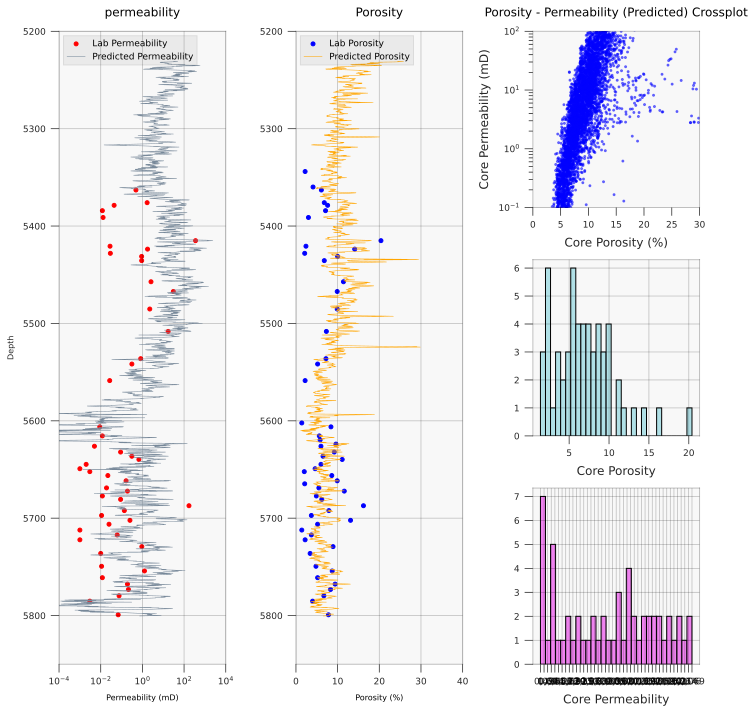

In [43]:
# Another way to perform comparison between the well log measurements and the predicted values 
fig.suptitle("RANDOM FOREST PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.8, wspace=0.15)

track_names = ['Predicted Permeability (mD)', 'Lab Permeability (mD)', 'Predicted Porosity (%)', 'Lab Porosity (%)']

#Add lines from the CPI dataframe to the plot.

#Create the figure
fig, ax = plt.subplots(figsize=(10,10))

#Add the axes / subplots using subplot2grid
ax1 = plt.subplot2grid(shape=(3,3), loc=(0,0), rowspan=3)
ax2 = plt.subplot2grid(shape=(3,3), loc=(0,1), rowspan=3)
ax3 = plt.subplot2grid(shape=(3,3), loc=(0,2), rowspan=1)
ax4 = plt.subplot2grid(shape=(3,3), loc=(1,2), rowspan=1)
ax5 = plt.subplot2grid(shape=(3,3), loc=(2,2), rowspan=1)

#####
ax1.scatter(K_lab.str.replace(',', '.').astype(float), DEPTH_lab.str.replace(',', '.').astype(float), label="Lab Permeability", color='r')
ax1.plot(k, df["DEPTH"], color="lightslategray", label="Predicted Permeability", lw=0.5)
ax1.semilogx()
ax1.set_xlabel('Permeability (mD)', fontsize=8, color='black')
ax1.set_ylabel('Depth', fontsize=8)
ax1.set_title('permeability')
ax1.legend(loc='upper left', bbox_to_anchor=(0.0, 1.0)).get_frame().set_facecolor('gray') # Set the background color

ax2.scatter(PHI_lab.astype(float), DEPTH_lab.str.replace(',', '.').astype(float), label="Lab Porosity", color='b')
ax2.plot(y_prediction_rf_TOT*100, df["DEPTH"], color = "orange", label="Predicted Porosity", lw = 0.5, linestyle = '-' ) 
ax2.set_xlabel('Porosity (%)', fontsize=8, color='black')
ax2.set_title('Porosity')
ax2.legend(loc='upper left', bbox_to_anchor=(0.0, 1.0)).get_frame().set_facecolor('gray') # Set the background color


#Add ax3 to show CPOR (Core Porosity) vs CKHG (Core Permeability)
#ax3.scatter(df_Ptroph["Porosidade%"], df_Ptroph["Permeabilidade Long. (mD)"], marker='.', alpha=0.5)
ax3.scatter(y_prediction_rf_TOT*100, k, marker='.', alpha=0.5, color='blue')
ax3.semilogy()
ax3.set_ylim(0.1, 100)
ax3.set_xlim(0, 30)
ax3.set_title('Porosity - Permeability (Predicted) Crossplot')
ax3.set_xlabel('Core Porosity (%)')
ax3.set_ylabel('Core Permeability (mD)')
ax3.grid()

#Add ax4 to show a histogram of CPOR - Core Porosity
ax4.hist(PHI_lab, bins=30, edgecolor='black', color='powderblue')
ax4.set_xlabel('Core Porosity')



ax5.hist(K_lab, bins=30, edgecolor='black', color='violet')

ax5.set_xlabel('Core Permeability')




# for Permeability limits
for ax in [ax1]:
    ax.set_xlim(0.0001, 10000)
    ax.set_ylim(5850,5200)

# for Porosity limits
for ax in [ax2]:
    ax.set_xlim(0,40)
    ax.set_ylim(5850,5200)


plt.tight_layout()
plt.show()

# =======================================================

<span style='color:blue'> <span style="font-size:30px;">**Gradient Boosting**</span> </span>

In [44]:
y_prediction_gb = GradientBoosting_model.predict(X)

# Extract the predicted values for output 1, output 2 and output 3
y_prediction_gb_EFF = y_prediction_gb[:, 0]
y_prediction_gb_FF = y_prediction_gb[:, 1]
y_prediction_gb_TOT = y_prediction_gb[:, 2]


# Measurement Values of Y (NMR ==> EFECTIVE, Free Fluid, TCMR)
y_EFF = y.drop(columns=["NMRFF","NMRTOT"])      # CMRP_3MS [EFECTIVE Porosity]
y_FF = y.drop(columns=["NMREFF","NMRTOT"])   # CMFF [Free Fluid Porosity]
y_TOT = y.drop(columns=["NMREFF","NMRFF"])  # TCMR [Total Porosity]

In [45]:
# Permeability
FF = y_prediction_gb_FF
PHI_tot = y_prediction_gb_TOT
BF = y_prediction_gb_TOT - y_prediction_gb_FF
a = 10**4
b = 2
c = 4

# Calculate k
k = a * ((FF / BF) ** b) * (PHI_tot ** c)

#================================================
# Saturation
FF = y_prediction_gb_FF
PHI_eff = y_prediction_gb_EFF
PHI_tot = y_prediction_gb_TOT

Swie = ((PHI_tot-FF)/ PHI_eff)*100

<span style='color:gray'> <span style="font-size:30px;">**Plots**</span> </span>

<span style='color:gray'> <span style="font-size:20px;">**Gradient Boosting - Scatter Plot**</span> </span>

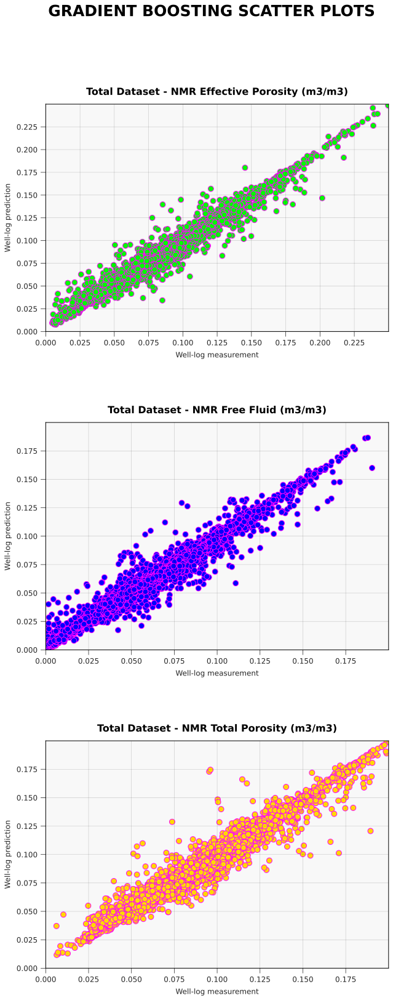

In [46]:
# Random Forest Scatter Plots 
fig, ax = plt.subplots(3,1, figsize=(10,25))
fig.suptitle("GRADIENT BOOSTING SCATTER PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.89,hspace=0.4)

#Set up the subplots grid
ax1 = plt.subplot2grid((3,1),(0,0),rowspan=1,colspan=1) 
ax2 = plt.subplot2grid((3,1),(1,0),rowspan=1,colspan=1) 
ax3 = plt.subplot2grid((3,1),(2,0),rowspan=1,colspan=1) 


# First Scatter Plot
ax1.scatter(y_EFF,y_prediction_gb_EFF, s=80, c='lime', edgecolors='magenta')
ax1.set_xlabel('Well-log measurement', fontsize=12) 
ax1.set_ylabel('Well-log prediction', fontsize=12)
ax1.set_title('Total Dataset - NMR Effective Porosity (m3/m3)', fontsize=16, fontweight='bold')
ax1.set_xlim(0,0.25)
ax1.set_ylim(0,0.25)
ax1.set_xticks(np.arange(0, 0.25, 0.025))
ax1.set_yticks(np.arange(0, 0.25, 0.025))

# Second Scatter Plot
ax2.scatter(y_FF,y_prediction_gb_FF, s=80, c='blue', edgecolors='magenta')
ax2.set_xlabel('Well-log measurement', fontsize=12) 
ax2.set_ylabel('Well-log prediction', fontsize=12)
ax2.set_title('Total Dataset - NMR Free Fluid (m3/m3)', fontsize=16, fontweight='bold')
ax2.set_xlim(0,0.200)
ax2.set_ylim(0,0.200)
ax2.set_xticks(np.arange(0, 0.200, 0.025))
ax2.set_yticks(np.arange(0, 0.200, 0.025))

# Third Scatter Plot 
ax3.scatter(y_TOT,y_prediction_gb_TOT, s=80, c='gold', edgecolors='magenta')
ax3.set_xlabel('Well-log measurement', fontsize=12) 
ax3.set_ylabel('Well-log prediction', fontsize=12)
ax3.set_title('Total Dataset - NMR Total Porosity (m3/m3)', fontsize=16, fontweight='bold')
ax3.set_xlim(0,0.200)
ax3.set_ylim(0,0.200)
ax3.set_xticks(np.arange(0, 0.200, 0.025))
ax3.set_yticks(np.arange(0, 0.200, 0.025))


# Add a black border to each subplot
for ax in [ax1,ax2,ax3]:
    ax.spines['top'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    
# Set font size of the tick labels
for ax in [ax1,ax2,ax3]:
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
# Set grid 
for ax in [ax1,ax2,ax3]:
    ax.grid(color='black',lw=0.5)

<span style='color:gray'> <span style="font-size:20px;">**Gradient Boosting - Well-log Plot**</span> </span>

Plotting **Predicted NMR** & **Measured (log) NMR** + **Permeability and Satutration from Predicted NMR**

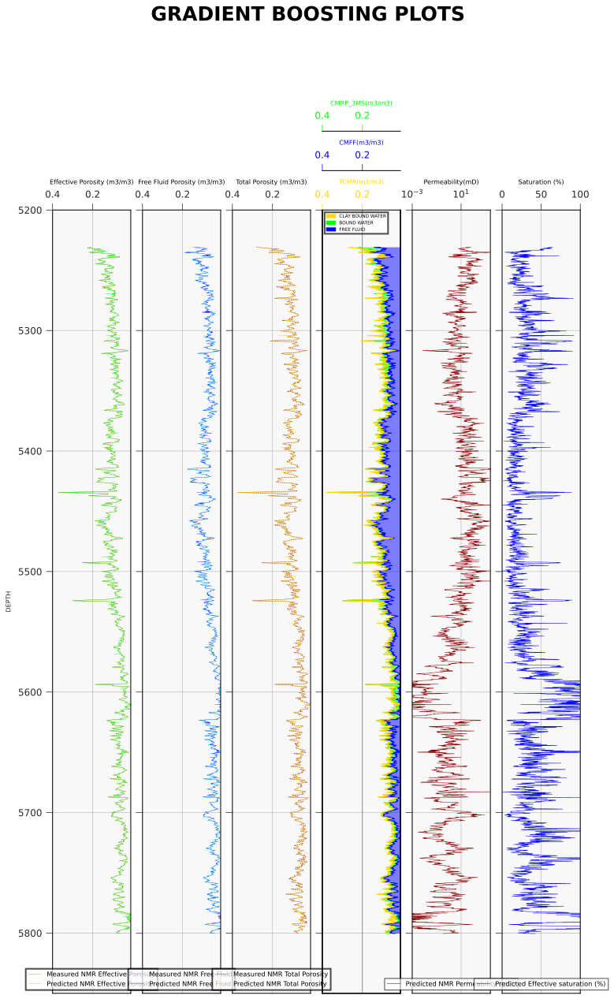

In [47]:
# Another way to perform comparison between the well log measurements and the predicted values 
fig, axes = plt.subplots(nrows=1, ncols=6, figsize=(12,20))
fig.suptitle("GRADIENT BOOSTING PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.8, wspace=0.15)

track_names = ['EFFNMR (m3/m3)','FFNMR(m3/m3)','TOTNMR(m3/m3)','CMRP_3MS(m3/m3)','CMFF(m3/m3)','TCMR(m3/m3)']


#Set up the subplots grid
ax1 = plt.subplot2grid((1,6),(0,0),rowspan=1,colspan=1) 
ax2 = plt.subplot2grid((1,6),(0,1),rowspan=1,colspan=1) 
ax3 = plt.subplot2grid((1,6),(0,2),rowspan=1,colspan=1) 
ax4 = plt.subplot2grid((1,6),(0,3),rowspan=1,colspan=1) 
ax5 = ax4.twiny()
ax6 = ax4.twiny()
ax7 = plt.subplot2grid((1,6),(0,4),rowspan=1,colspan=1) 
ax8 = plt.subplot2grid((1,6),(0,5),rowspan=1,colspan=1) 

#==================
# First Plot
ax1.plot(y_EFF, df["DEPTH"], color = "olive", lw = 0.5, linestyle = '--')
ax1.plot(y_prediction_gb_EFF, df["DEPTH"], color = "lime", lw = 0.25, linestyle = '-')  
ax1.set_xlabel('Effective Porosity (m3/m3)',fontsize=8, color='black') 
ax1.set_ylabel('DEPTH',fontsize=8)
legend1 = ax1.legend(["Measured NMR Effective Porosity", "Predicted NMR Effective Porosity"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Second Plot
ax2.plot(y_FF, df["DEPTH"], color = "aqua", lw = 0.5, linestyle = '--')
ax2.plot(y_prediction_gb_FF, df["DEPTH"], color = "blue", lw = 0.25, linestyle = '-')
ax2.set_xlabel('Free Fluid Porosity (m3/m3)',fontsize=8, color='black')
legend2 = ax2.legend(["Measured NMR Free Fluid", "Predicted NMR Free Fluid"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Third Plot 
ax3.plot(y_TOT, df["DEPTH"], color = "darkred", lw = 0.5, linestyle = '--')
ax3.plot(y_prediction_gb_TOT, df["DEPTH"], color = "gold", lw = 0.25, linestyle = '-')
ax3.set_xlabel('Total Porosity (m3/m3)',fontsize=8, color='black')
legend3 = ax3.legend(["Measured NMR Total Porosity", "Predicted NMR Total Porosity"], loc= 'lower center',fontsize='small', framealpha=0.7)

#==================
# Fourth Plot
ax4.plot(y_prediction_gb_EFF, df["DEPTH"], color = "lime", lw = 1, linestyle = '-')                                                    
ax4.spines['top'].set_position(('outward',100))
ax4.set_xlabel('CMRP_3MS(m3/m3)',fontsize=8, color='lime') 
ax4.tick_params(axis='x', colors='lime', labelsize=12)
ax4.spines["top"].set_edgecolor("lime")

ax5.plot(y_prediction_gb_FF, df["DEPTH"], color = "blue", lw = 1, linestyle = '-' )
ax5.spines['top'].set_position(('outward',50))
ax5.set_xlabel('CMFF(m3/m3)', fontsize=8, color='blue') 
ax5.tick_params(axis='x', colors='blue', labelsize=12)
ax5.spines["top"].set_edgecolor("blue")

ax6.plot(y_prediction_gb_TOT, df["DEPTH"], color = "gold", lw = 1, linestyle = '-' )                                                  
ax6.spines['top'].set_position(('outward',0))
ax6.set_xlabel('TCMR(m3/m3)', fontsize=8, color='gold')
ax6.tick_params(axis='x', colors='gold', labelsize=12)
ax6.spines["top"].set_edgecolor("gold")

# Add shading in Fifth Track with fill_betweenx(y, left handside value, x)
ax4.fill_betweenx(df["DEPTH"],y_prediction_gb_FF,0,                   facecolor='blue', alpha=0.5, interpolate=True)
ax4.fill_betweenx(df["DEPTH"],y_prediction_gb_EFF,y_prediction_gb_FF, facecolor='lime', alpha=0.5, interpolate=True)
ax4.fill_betweenx(df["DEPTH"],y_prediction_gb_TOT,y_prediction_gb_EFF, facecolor='gold', alpha=0.5, interpolate=True)

# Create legend for Fifth Track 
Clay_Bound_Water = mpatches.Patch(color='gold', label='CLAY BOUND WATER')
Bound_Water      = mpatches.Patch(color='lime', label='BOUND WATER')
Free_Fluid       = mpatches.Patch(color='blue', label='FREE FLUID')
legend4 = ax4.legend(handles=[Clay_Bound_Water, Bound_Water, Free_Fluid], loc='upper left', fontsize='xx-small', framealpha=0.7)

#==================

ax7.plot(k, df["DEPTH"], color="darkred", lw=0.5, markersize=2)
ax7.semilogx()                                                            
ax7.set_xlabel('Permeability(mD)',fontsize=8, color='black')
legend5 = ax7.legend(["Predicted NMR Permeability (mD)"],loc= 'lower center', fontsize='small', framealpha=0.7)

#==================

ax8.plot(Swie, df["DEPTH"], color="blue", lw=0.5, markersize=2)
ax8.set_xlabel('Saturation (%)',fontsize=8, color='black')
legend6 = ax8.legend(["Predicted Effective saturation (%)"], loc= 'lower center',fontsize='small', framealpha=0.7)


# for NMR limits
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.set_xlim(0.4,0.01)
    ax.set_ylim(5850,5200) 

# for permeability  limits
for ax in [ax7]:
    ax7.set_xlim(0.001, 2500) 
    ax.set_ylim(5850,5200) 

# for saturation limits
for ax in [ax8]:
    ax.set_xlim(0,100)
    ax.set_ylim(5850,5200) 


# Add a black border to each subplot
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.spines['top'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.spines['right'].set_color('black')
    
# Set font size of the tick labels
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
# Set grid 
for ax in [ax1,ax2,ax3,ax4,ax5,ax6, ax7, ax8]:
    ax.grid(color='black',lw=0.7)
    
# Hide tick labels on the y-axis
for ax in [ax2,ax3,ax4, ax5, ax6, ax7, ax8]:
    plt.setp(ax.get_yticklabels(), visible=False)
    
# Set border properties of the legend 
for legend in [legend1,legend2,legend3,legend4]:
    legend.get_frame().set_linewidth(2)
    legend.get_frame().set_edgecolor('black')
    
# Set xlabel and xticks position 
for ax in [ax1,ax2,ax3,ax4, ax5, ax6, ax7, ax8]:
    ax.xaxis.set_label_position("top")
    ax.xaxis.set_ticks_position("top")

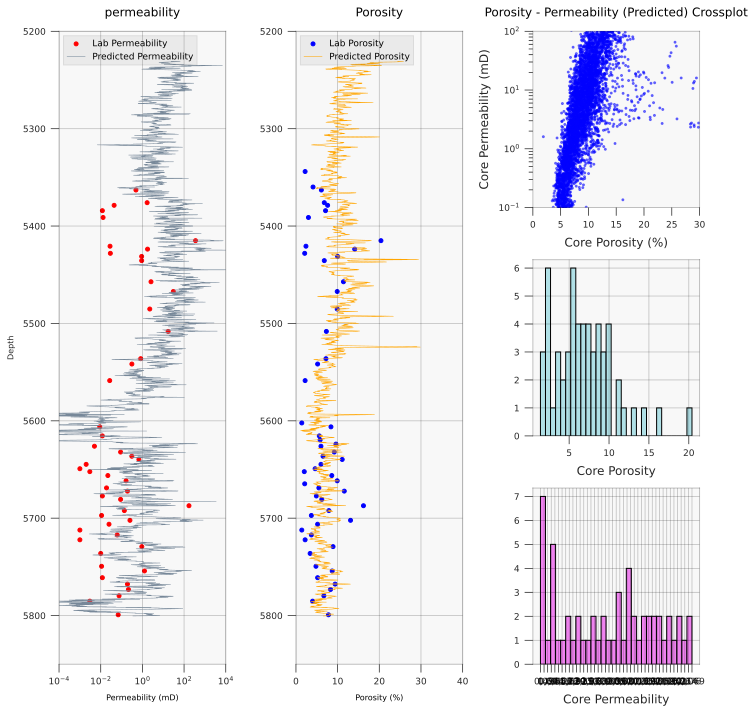

In [48]:
# Another way to perform comparison between the well log measurements and the predicted values 
fig.suptitle("GRADIENT BOOSTING PLOTS", fontsize=25, fontweight='bold')
fig.subplots_adjust(top=0.8, wspace=0.15)

track_names = ['Predicted Permeability (mD)', 'Lab Permeability (mD)', 'Predicted Porosity (%)', 'Lab Porosity (%)']

#Add lines from the CPI dataframe to the plot.

#Create the figure
fig, ax = plt.subplots(figsize=(10,10))

#Add the axes / subplots using subplot2grid
ax1 = plt.subplot2grid(shape=(3,3), loc=(0,0), rowspan=3)
ax2 = plt.subplot2grid(shape=(3,3), loc=(0,1), rowspan=3)
ax3 = plt.subplot2grid(shape=(3,3), loc=(0,2), rowspan=1)
ax4 = plt.subplot2grid(shape=(3,3), loc=(1,2), rowspan=1)
ax5 = plt.subplot2grid(shape=(3,3), loc=(2,2), rowspan=1)

#####
ax1.scatter(K_lab.str.replace(',', '.').astype(float), DEPTH_lab.str.replace(',', '.').astype(float), label="Lab Permeability", color='r')
ax1.plot(k, df["DEPTH"], color="lightslategray", label="Predicted Permeability", lw=0.5)
ax1.semilogx()
ax1.set_xlabel('Permeability (mD)', fontsize=8, color='black')
ax1.set_ylabel('Depth', fontsize=8)
ax1.set_title('permeability')
ax1.legend(loc='upper left', bbox_to_anchor=(0.0, 1.0)).get_frame().set_facecolor('gray') # Set the background color

ax2.scatter(PHI_lab.astype(float), DEPTH_lab.str.replace(',', '.').astype(float), label="Lab Porosity", color='b')
ax2.plot(y_prediction_rf_TOT*100, df["DEPTH"], color = "orange", label="Predicted Porosity", lw = 0.5, linestyle = '-' ) 
ax2.set_xlabel('Porosity (%)', fontsize=8, color='black')
ax2.set_title('Porosity')
ax2.legend(loc='upper left', bbox_to_anchor=(0.0, 1.0)).get_frame().set_facecolor('gray') # Set the background color


#Add ax3 to show CPOR (Core Porosity) vs CKHG (Core Permeability)
#ax3.scatter(df_Ptroph["Porosidade%"], df_Ptroph["Permeabilidade Long. (mD)"], marker='.', alpha=0.5)
ax3.scatter(y_prediction_rf_TOT*100, k, marker='.', alpha=0.5, color='blue')
ax3.semilogy()
ax3.set_ylim(0.1, 100)
ax3.set_xlim(0, 30)
ax3.set_title('Porosity - Permeability (Predicted) Crossplot')
ax3.set_xlabel('Core Porosity (%)')
ax3.set_ylabel('Core Permeability (mD)')
ax3.grid()

#Add ax4 to show a histogram of CPOR - Core Porosity
ax4.hist(PHI_lab, bins=30, edgecolor='black', color='powderblue')
ax4.set_xlabel('Core Porosity')



ax5.hist(K_lab, bins=30, edgecolor='black', color='violet')

ax5.set_xlabel('Core Permeability')




# for Permeability limits
for ax in [ax1]:
    ax.set_xlim(0.0001, 10000)
    ax.set_ylim(5850,5200)

# for Porosity limits
for ax in [ax2]:
    ax.set_xlim(0,40)
    ax.set_ylim(5850,5200)


plt.tight_layout()
plt.show()

<span style='color:Green'> <span style="font-size:30px;">**=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+=+**</span> </span>

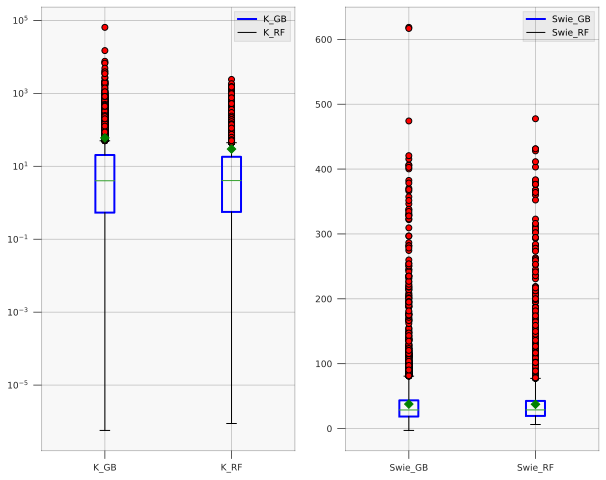

In [96]:
# Define a function to calculate k and Swie
def calculate_k_swie(y_prediction, model_name):
    FF = y_prediction[:, 1]  # Assuming index 1 corresponds to Free Fluid Porosity
    PHI_tot = y_prediction[:, 2]  # Assuming index 2 corresponds to Total Porosity
    BF = PHI_tot - FF
    
    a = 10**4
    b = 2
    c = 4

    # Calculate k
    k = a * ((FF / BF) ** b) * (PHI_tot ** c)

    # Calculate Swie
    PHI_eff = y_prediction[:, 0]  # Assuming index 0 corresponds to Effective Porosity
    Swie = ((PHI_tot-FF)/ PHI_eff)*100

    # Create DataFrames for 'k' and 'Swie'
    df_k = pd.DataFrame({f'k_{model_name}': k})
    df_swie = pd.DataFrame({f'Swie_{model_name}': Swie})

    return df_k, df_swie

# Calculate k and Swie for the Gradient Boosting model
y_prediction_gb = GradientBoosting_model.predict(X)
df_k_gb, df_swie_gb = calculate_k_swie(y_prediction_gb, 'gb')

# Calculate k and Swie for the Random Forest model
y_prediction_rf = RandomForest_model.predict(X)
df_k_rf, df_swie_rf = calculate_k_swie(y_prediction_rf, 'rf')

# Create DataFrames for 'k' for both models
df_K = pd.concat([df_k_gb, df_k_rf], axis=1)
#===============

# Create a box plot for 'K'
fig, ax = plt.subplots(figsize=(10, 8))


#Add the axes / subplots using subplot2grid
ax1 = plt.subplot2grid(shape=(1,2), loc=(0,0), rowspan=3)
ax2 = plt.subplot2grid(shape=(1,2), loc=(0,1), rowspan=3)

# Place the axes below the plot lines
ax1.set_axisbelow(True)



red_circle = dict(markerfacecolor='red', marker='o')
mean_shape = dict(markerfacecolor='green', marker='D', markeredgecolor='green')






# Create box plots for 'K'
boxprops = dict(linewidth=2, color='blue')
ax1.boxplot([df_K['k_gb'], df_K['k_rf']], vert=True, flierprops=red_circle, showmeans=True, meanprops=mean_shape, labels=['K_GB', 'K_RF'], boxprops=boxprops)
ax1.semilogy()

# Set the title for the plot (remove this line)
# plt.title('Box Plot for K for Gradient Boosting and Random Forest')

# Customize tick labels (remove this line)
# ax1.set_xticklabels(['K_GB', 'K_RF'])

# Add a legend for the 'K' box plots in the ax1 subplot
ax1.legend(['K_GB', 'K_RF']).get_frame().set_facecolor('gray') # Set the background color


#=================

# Create box plots for 'Swie'
boxprops = dict(linewidth=2, color='blue')
ax2.boxplot([df_swie_gb['Swie_gb'], df_swie_rf['Swie_rf']], vert=True, flierprops=red_circle, showmeans=True, meanprops=mean_shape, labels=['Swie_GB', 'Swie_RF'], boxprops=boxprops)
ax2.set_yscale("linear")  # Use linear scale for 'Swie'

# Set the title for the plot (remove this line)
# plt.title('Box Plot for Swie for Gradient Boosting and Random Forest')

# Customize tick labels (remove this line)
# ax2.set_xticklabels(['Swie_GB', 'Swie_RF'])

# Add a legend for the 'Swie' box plots in the ax2 subplot
ax2.legend(['Swie_GB', 'Swie_RF']).get_frame().set_facecolor('gray') # Set the background color


# Show the second plot (Swie)
plt.show()


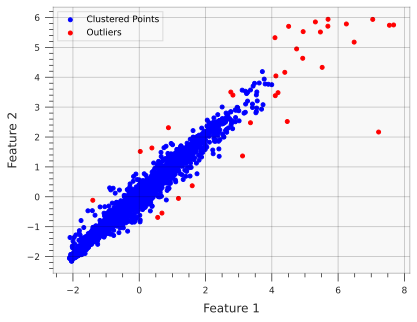

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Combine your data arrays into a single dataset
data = np.column_stack((y_EFF, y_prediction_rf_EFF))

# Normalize the data using StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(data)

# Set DBSCAN parameters (you should adjust these values)
epsilon = 0.3  # Maximum distance between points in a cluster
min_samples = 5  # Minimum number of samples in a cluster

# Create a DBSCAN object with the specified parameters
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)

# Fit the model to your data
dbscan.fit(normalized_data)

# Get the labels assigned by DBSCAN (-1 indicates outliers)
labels = dbscan.labels_

# Identify outliers
outliers = normalized_data[labels == -1]

# Separate clustered points and outliers
clustered_points = normalized_data[labels != -1]

# Plot the clustered points in blue and outliers in red
plt.scatter(clustered_points[:, 0], clustered_points[:, 1], c='blue', label='Clustered Points')
plt.scatter(outliers[:, 0], outliers[:, 1], c='red', label='Outliers')

# Add labels and legend
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()

# Show the plot
plt.show()
